In [1]:
#importing libraries
import pandas as pd
import numpy as np
import yfinance as yf
import requests
import matplotlib.pyplot as plt
import tensorflow as tf
import wandb
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.dates as mdates

from urllib.request import urlopen,Request
from bs4 import BeautifulSoup
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Nike Stock Overview

In [2]:
nke=yf.Ticker("NKE")

In [3]:
nke.info

{'address1': 'One Bowerman Drive',
 'city': 'Beaverton',
 'state': 'OR',
 'zip': '97005-6453',
 'country': 'United States',
 'phone': '503 671 6453',
 'website': 'https://www.nike.com',
 'industry': 'Footwear & Accessories',
 'industryKey': 'footwear-accessories',
 'industryDisp': 'Footwear & Accessories',
 'sector': 'Consumer Cyclical',
 'sectorKey': 'consumer-cyclical',
 'sectorDisp': 'Consumer Cyclical',
 'longBusinessSummary': 'NIKE, Inc., together with its subsidiaries, engages in the design, development, marketing, and sale of athletic footwear, apparel, equipment, accessories, and services worldwide. The company provides athletic and casual footwear, apparel, and accessories under the NIKE, Jumpman, Converse, Chuck Taylor, All Star, One Star, Star Chevron, and Jack Purcell trademarks. It also sells a line of performance equipment and accessories comprising bags, sport balls, socks, eyewear, timepieces, digital devices, bats, gloves, protective equipment, and other equipment for 

In [4]:
hist=nke.history(period="max")
hist

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
1980-12-02 00:00:00-05:00,0.127687,0.130463,0.127687,0.127687,100710400,0.0,0.0
1980-12-03 00:00:00-05:00,0.126299,0.126299,0.124911,0.124911,25177600,0.0,0.0
1980-12-04 00:00:00-05:00,0.129075,0.130463,0.129075,0.129075,22694400,0.0,0.0
1980-12-05 00:00:00-05:00,0.124911,0.124911,0.122135,0.122135,7590400,0.0,0.0
1980-12-08 00:00:00-05:00,0.116584,0.116584,0.115196,0.115196,5414400,0.0,0.0
...,...,...,...,...,...,...,...
2024-07-30 00:00:00-04:00,73.690002,74.489998,73.459999,74.320000,8515700,0.0,0.0
2024-07-31 00:00:00-04:00,74.500000,75.430000,73.919998,74.860001,14632900,0.0,0.0
2024-08-01 00:00:00-04:00,74.699997,74.790001,73.260002,73.849998,9563500,0.0,0.0


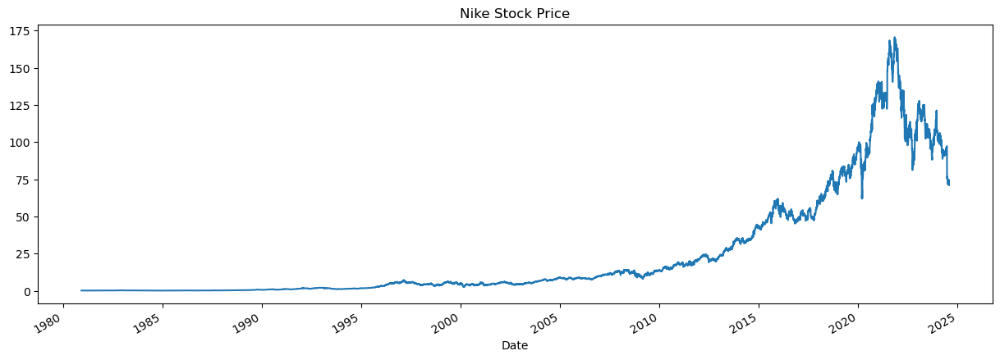

In [5]:
hist['Open'].plot(figsize=(15,5),title='Nike Stock Price')
plt.show()

In [6]:
nke.actions

,Dividends,Stock Splits
Date,,
1987-09-04 00:00:00-04:00,0.000625,0.0
1987-12-07 00:00:00-05:00,0.001563,0.0
1988-03-14 00:00:00-05:00,0.001563,0.0
1988-06-13 00:00:00-04:00,0.001563,0.0
1988-09-12 00:00:00-04:00,0.001563,0.0
...,...,...
2023-06-02 00:00:00-04:00,0.340000,0.0
2023-09-01 00:00:00-04:00,0.340000,0.0
2023-12-01 00:00:00-05:00,0.370000,0.0


In [7]:
nke.splits

Date
1990-10-08 00:00:00-04:00    2.0
1995-10-31 00:00:00-05:00    2.0
1996-10-24 00:00:00-04:00    2.0
2007-04-03 00:00:00-04:00    2.0
2012-12-26 00:00:00-05:00    2.0
2015-12-24 00:00:00-05:00    2.0
Name: Stock Splits, dtype: float64

In [8]:
nke.calendar

{'Dividend Date': datetime.date(2024, 10, 1),
 'Ex-Dividend Date': datetime.date(2024, 9, 3),
 'Earnings Date': [datetime.date(2024, 9, 26), datetime.date(2024, 9, 30)],
 'Earnings High': 0.64,
 'Earnings Low': 0.45,
 'Earnings Average': 0.52,
 'Revenue High': 11842000000,
 'Revenue Low': 11565800000,
 'Revenue Average': 11648600000}

# Pulling Out a Bunch Of Stocks
-5 years History

In [9]:
stocks=['AMZN','TCS','BTI','YUMC','NOW','MSFT','CRWD','TRGP','AVGO','MU']

In [10]:
h={}
for s in stocks:
    ticker=yf.Ticker(s)
    history=ticker.history(period="5y")
    h[s]=history

In [11]:
for stock in stocks:
    temp_df=h[stock].copy()
    fig=go.Figure(
    data=[
        go.Candlestick(
        x=temp_df.index,
        open=temp_df["Open"],
        high=temp_df["High"],
        low=temp_df["Low"],
        close=temp_df["Close"],)
    ])
    fig.update_layout(
          margin=dict(l=30,r=25,t=60,b=25),
          height=500,
          paper_bgcolor="Beige",
          title=stock,
    )
    fig.show()

# Pull NewsAbout Each Stock

In [12]:
main_url='https://finviz.com/quote.ashx?t='

stocks=['NKE','AMZN','TCS','BTI','YUMC','NOW','MSFT','CRWD','TRGP','AVGO','MU']

news_tables={}

for s in stocks:
    url=main_url+s
    req=Request(url=url,headers={'user-agent':'my-app'})
    response=urlopen(req)
    
    soup = BeautifulSoup(response,'html.parser')
    news_table= soup.find(id='news-table')
    news_tables[s]=news_table
    
parsed_data=[]

for s, news_table in news_tables.items():
    for rows in news_table.findAll('tr'):
        title=rows.a.text
        date_time=rows.td.text.strip().replace('\r\n', '').strip()
        parsed_data.append([s, date_time, title])  

df = pd.DataFrame(parsed_data, columns=['Stock', 'Date and Time', 'Title'])
df['Date and Time'] = df['Date and Time'].str.replace(r'\s+', ' ', regex=True).str.strip()
print(df)

     Stock      Date and Time  \
0      NKE      Today 05:45AM   
1      NKE  Aug-05-24 12:47PM   
2      NKE            09:30AM   
3      NKE            08:15AM   
4      NKE            08:12AM   
...    ...                ...   
1095    MU            11:57AM   
1096    MU            07:12AM   
1097    MU  Jul-04-24 12:12PM   
1098    MU            08:41AM   
1099    MU            06:35AM   

                                                  Title  
0     NIKE, Inc. Sued for Securities Law Violations ...  
1     NIKE, Inc. Sued for Securities Law Violations ...  
2                 3 Unstoppable Stocks to Buy in August  
3      Best Stock to Buy Right Now: Nike vs. On Holding  
4     Serena Williams Embraces Athleisure in Nike Le...  
...                                                 ...  
1095            Should You Buy Micron Stock on the Dip?  
1096  Heard on the Street: AI Boom Is Double-Edged S...  
1097  3 Tech Stocks to Sell in July Before They Cras...  
1098  Nvidia Stock Has 

# Sentimental Analysis


In [13]:
from transformers import TFAutoModelForSequenceClassification, AutoTokenizer
model_name = "ProsusAI/finbert"  # FinBERT is often used for financial sentiment analysis
model = TFAutoModelForSequenceClassification.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)

All model checkpoint layers were used when initializing TFBertForSequenceClassification.

Some layers of TFBertForSequenceClassification were not initialized from the model checkpoint at ProsusAI/finbert and are newly initialized: ['classifier']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


# Each Sentence Sentiments


In [26]:
def preprocess(texts):
    return tokenizer(texts, padding=True, truncation=True, return_tensors="tf")

def get_sentiment(predictions):
    sentiment_labels = ["negative", "neutral", "positive"]
    predicted_sentiments = np.argmax(predictions, axis=1)
    return [sentiment_labels[pred] for pred in predicted_sentiments]

inputs = preprocess(df['Title'].tolist())


In [27]:
outputs = model(inputs)
logits = outputs.logits
predictions = tf.nn.softmax(logits, axis=-1)

# Get sentiments
df['Sentiment'] = get_sentiment(predictions)

#Print sentiments
result_df = df[['Stock', 'Title', 'Sentiment']]
print(result_df)

     Stock                                              Title Sentiment
0      NKE  NIKE, Inc. Sued for Securities Law Violations ...  positive
1      NKE  NIKE, Inc. Sued for Securities Law Violations ...  positive
2      NKE              3 Unstoppable Stocks to Buy in August  positive
3      NKE   Best Stock to Buy Right Now: Nike vs. On Holding  positive
4      NKE  Serena Williams Embraces Athleisure in Nike Le...  positive
...    ...                                                ...       ...
1095    MU            Should You Buy Micron Stock on the Dip?  positive
1096    MU  Heard on the Street: AI Boom Is Double-Edged S...  positive
1097    MU  3 Tech Stocks to Sell in July Before They Cras...  positive
1098    MU  Nvidia Stock Has Dropped 5% Since Its Peak. Th...  positive
1099    MU  7 Top-Rated Semiconductor Stocks for Your July...  positive

[1100 rows x 3 columns]


# #Classifying positive,negative and neutral sentiment values for each news

In [16]:
def preprocess(texts):
    return tokenizer(texts, padding=True, truncation=True, return_tensors="tf")

positive_scores = predictions[:, 2].numpy()
neutral_scores = predictions[:, 1].numpy()
negative_scores = predictions[:, 0].numpy()

inputs = preprocess(df['Title'].tolist())

In [17]:
outputs = model(inputs)
logits = outputs.logits
predictions = tf.nn.softmax(logits, axis=-1)

df['Positive'] = positive_scores
df['Neutral'] = neutral_scores
df['Negative'] = negative_scores

# Displaying columns
result_df = df[['Stock', 'Title', 'Positive', 'Neutral', 'Negative']]
print(result_df)

     Stock                                              Title  Positive  \
0      NKE  NIKE, Inc. Sued for Securities Law Violations ...  0.441735   
1      NKE  NIKE, Inc. Sued for Securities Law Violations ...  0.438703   
2      NKE              3 Unstoppable Stocks to Buy in August  0.411193   
3      NKE   Best Stock to Buy Right Now: Nike vs. On Holding  0.425376   
4      NKE  Serena Williams Embraces Athleisure in Nike Le...  0.435702   
...    ...                                                ...       ...   
1095    MU            Should You Buy Micron Stock on the Dip?  0.461250   
1096    MU  Heard on the Street: AI Boom Is Double-Edged S...  0.462784   
1097    MU  3 Tech Stocks to Sell in July Before They Cras...  0.445436   
1098    MU  Nvidia Stock Has Dropped 5% Since Its Peak. Th...  0.437553   
1099    MU  7 Top-Rated Semiconductor Stocks for Your July...  0.425116   

       Neutral  Negative  
0     0.184898  0.373368  
1     0.204697  0.356600  
2     0.301810  0.

In [18]:
result_df.to_csv('SentimentOfStocks',index=False)

In [19]:
result_df.head()

,Stock,Title,Positive,Neutral,Negative
0,NKE,"NIKE, Inc. Sued for Securities Law Violations ...",0.441735,0.184898,0.373368
1,NKE,"NIKE, Inc. Sued for Securities Law Violations ...",0.438703,0.204697,0.356600
2,NKE,3 Unstoppable Stocks to Buy in August,0.411193,0.301810,0.286997
3,NKE,Best Stock to Buy Right Now: Nike vs. On Holding,0.425376,0.237083,0.337541
4,NKE,Serena Williams Embraces Athleisure in Nike Le...,0.435702,0.276977,0.287321


In [20]:
wandb.init(project="StockPrediction_SentimentAnalysisProject")

wandb: Currently logged in as: ankitajaiswal72-m (ankitajaiswal72-m-dayananda-sagar-institutions). Use `wandb login --relogin` to force relogin


In [21]:
wandb.run.log({"Financial Sentiment Analysis Table" : wandb.Table(dataframe=result_df)})
wandb.run.finish()

# Visualization Of Stocks

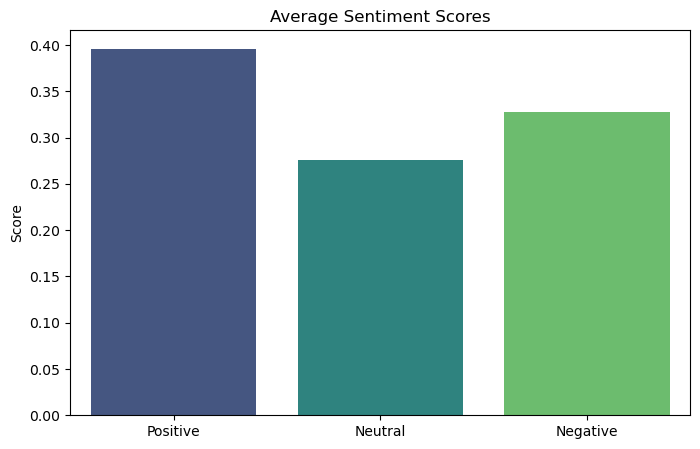

In [28]:
average_scores = df[['Positive', 'Neutral', 'Negative']].mean()

# Plot the average sentiment scores
plt.figure(figsize=(8, 5))
sns.barplot(x=average_scores.index, y=average_scores.values, palette='viridis')
plt.title('Average Sentiment Scores')
plt.ylabel('Score')
plt.show()

# Distribution Of Sentiment Scores

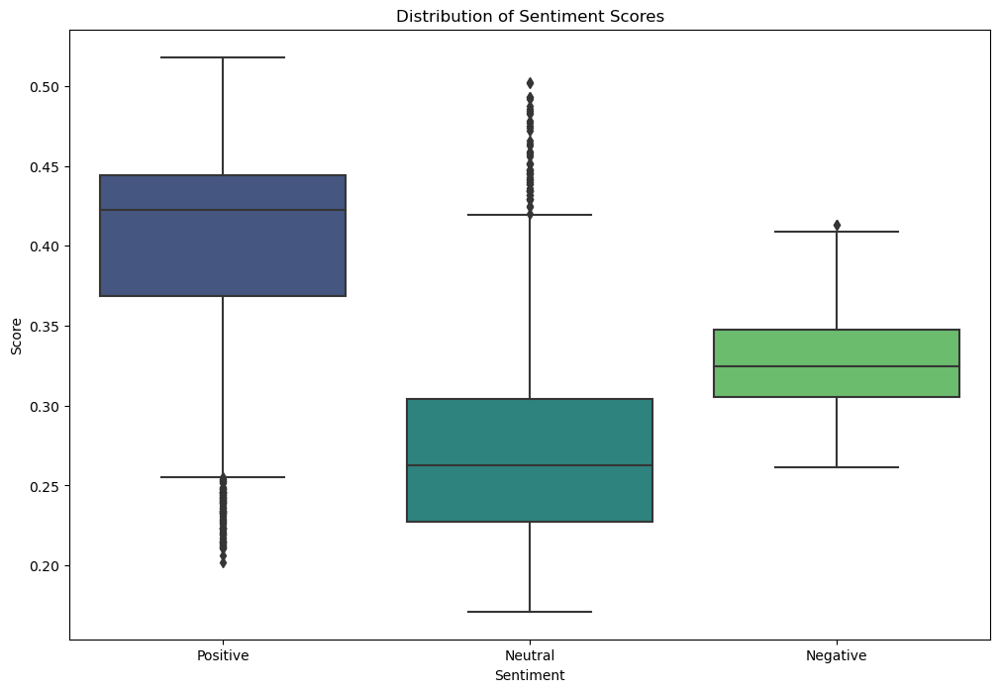

In [23]:
# Plot the distribution of sentiment scores for each title
df_long = df.melt(id_vars=['Stock', 'Title'], value_vars=['Positive', 'Neutral', 'Negative'],
                  var_name='Sentiment', value_name='Score')

plt.figure(figsize=(12, 8))
sns.boxplot(x='Sentiment', y='Score', data=df_long, palette='viridis')
plt.title('Distribution of Sentiment Scores')
plt.show()

# Count Of Predicted Sentiments

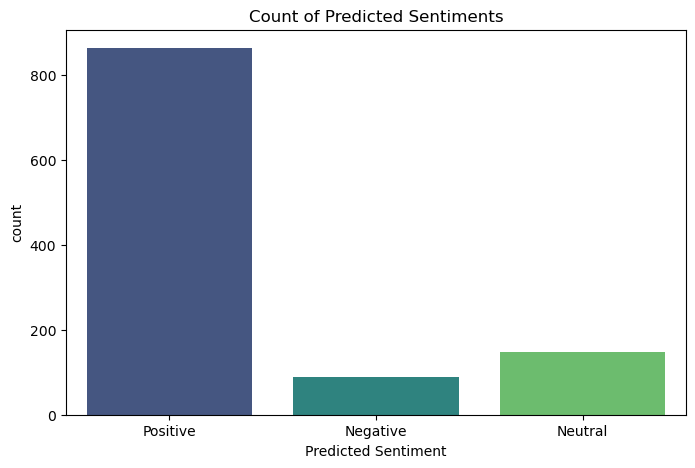

In [24]:
# Classify each title based on the highest sentiment score
df['Predicted Sentiment'] = df[['Positive', 'Neutral', 'Negative']].idxmax(axis=1)

# Plot the count of each predicted sentiment
plt.figure(figsize=(8, 5))
sns.countplot(x='Predicted Sentiment', data=df, palette='viridis')
plt.title('Count of Predicted Sentiments')
plt.show()

# Sentiments trend by company


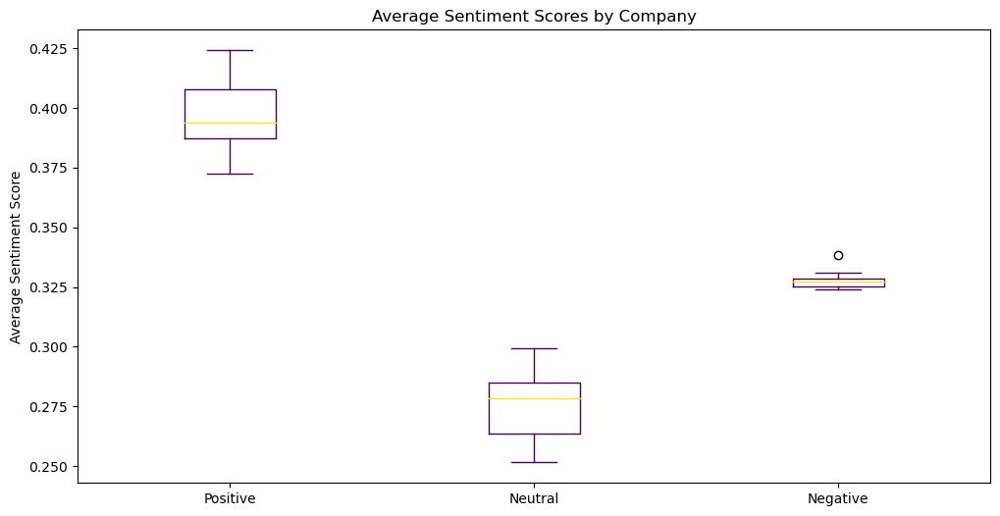

In [25]:
# Aggregate average sentiment scores by company
avg_sentiment_by_company = df.groupby('Stock')[['Positive', 'Neutral', 'Negative']].mean().reset_index()

# Plot average sentiment scores by company
avg_sentiment_by_company.set_index('Stock').plot(kind='box', figsize=(12, 6), stacked=True, colormap='viridis')
plt.title('Average Sentiment Scores by Company')
plt.ylabel('Average Sentiment Score')
plt.show()


# Time Series Analysis For Stocks


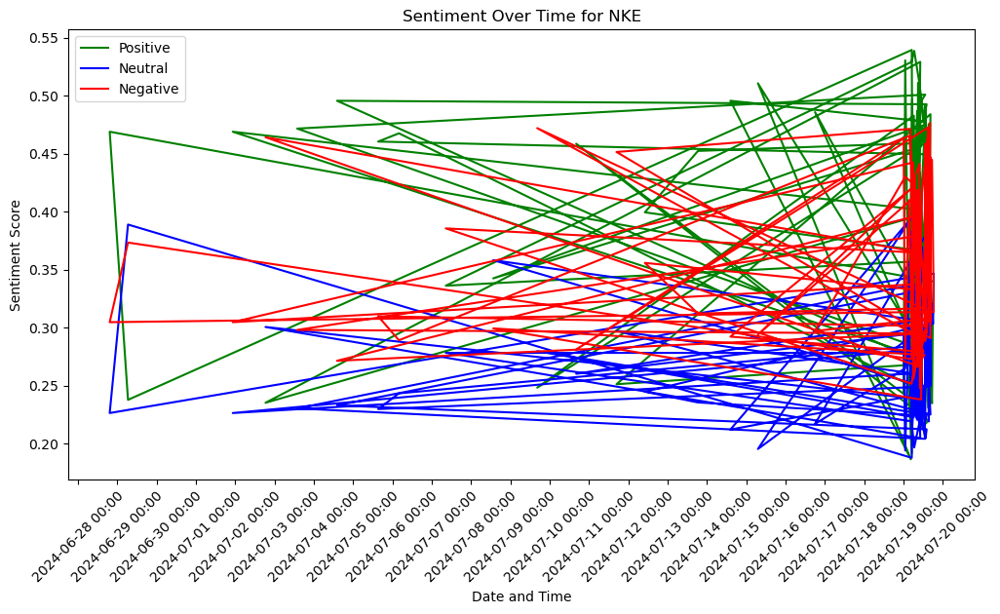

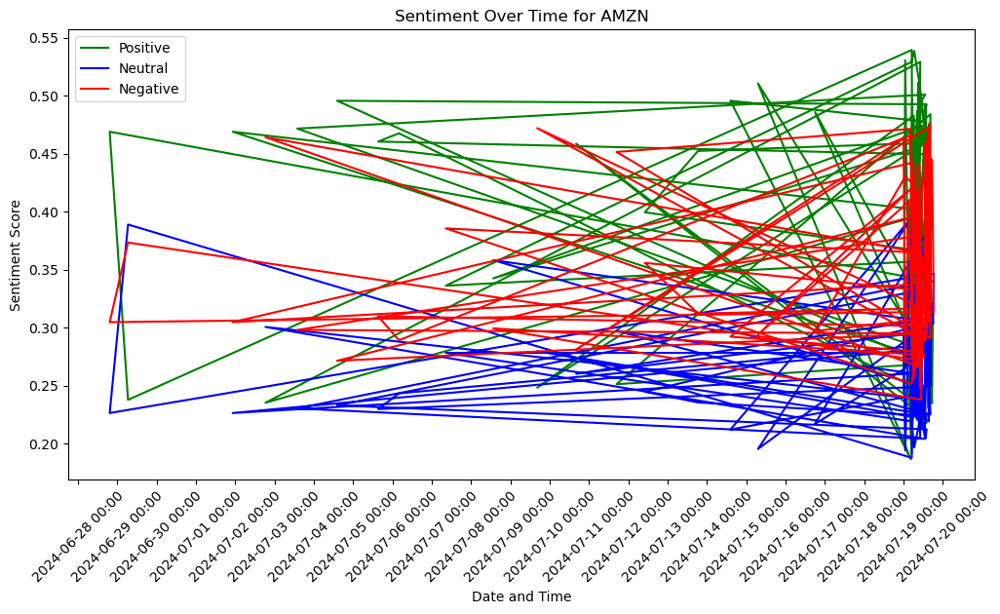

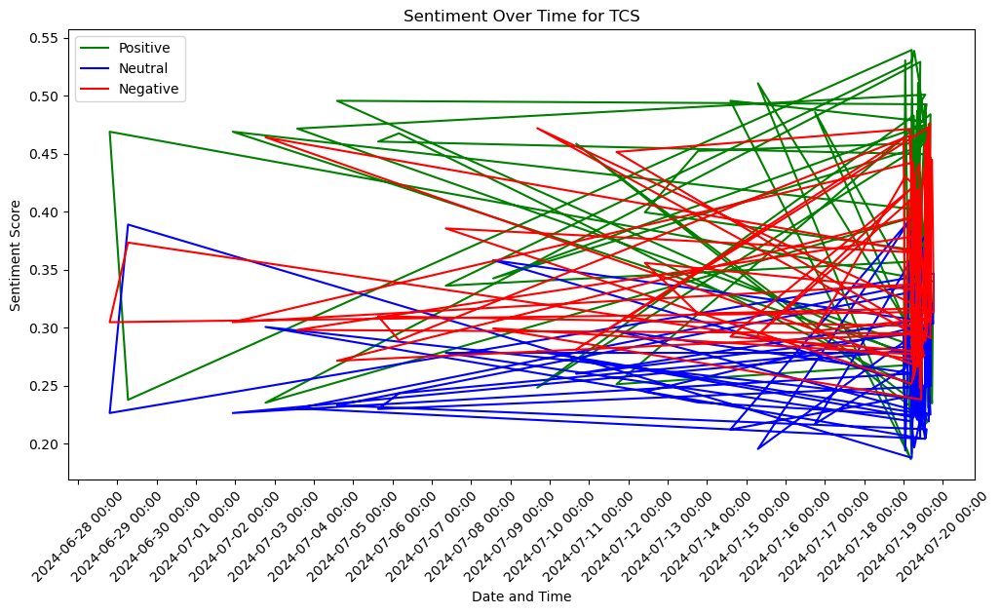

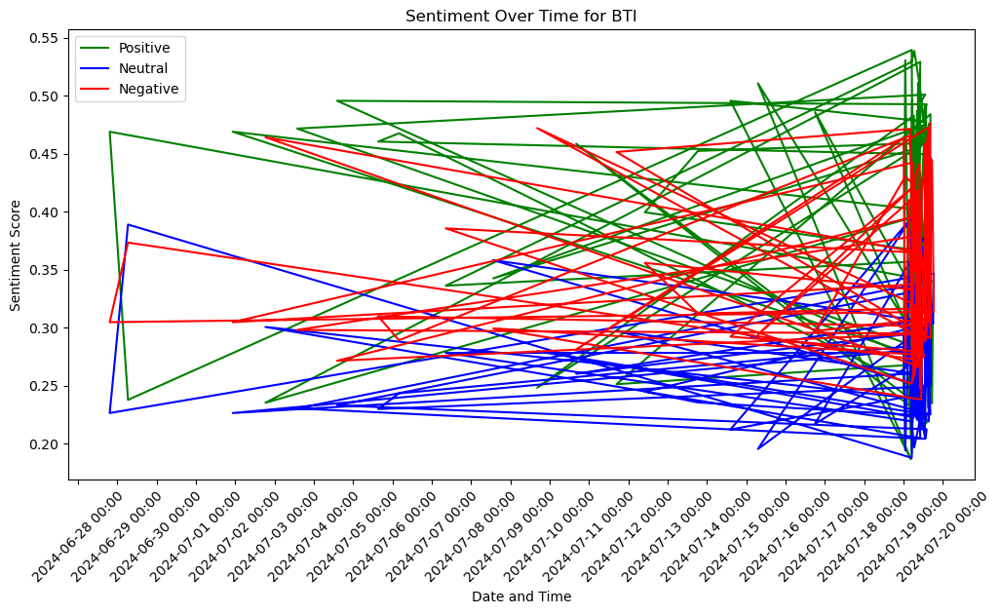

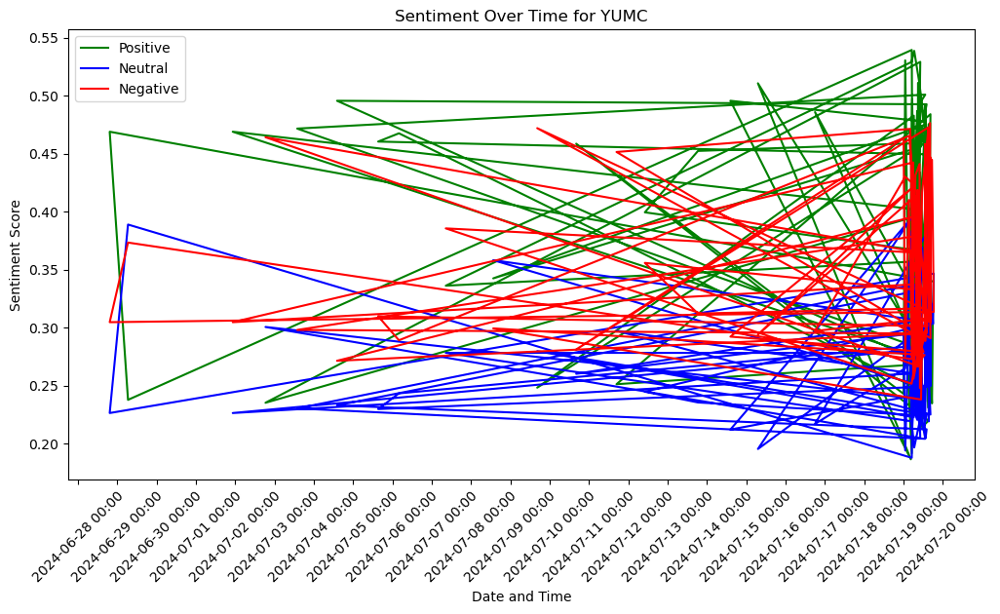

...

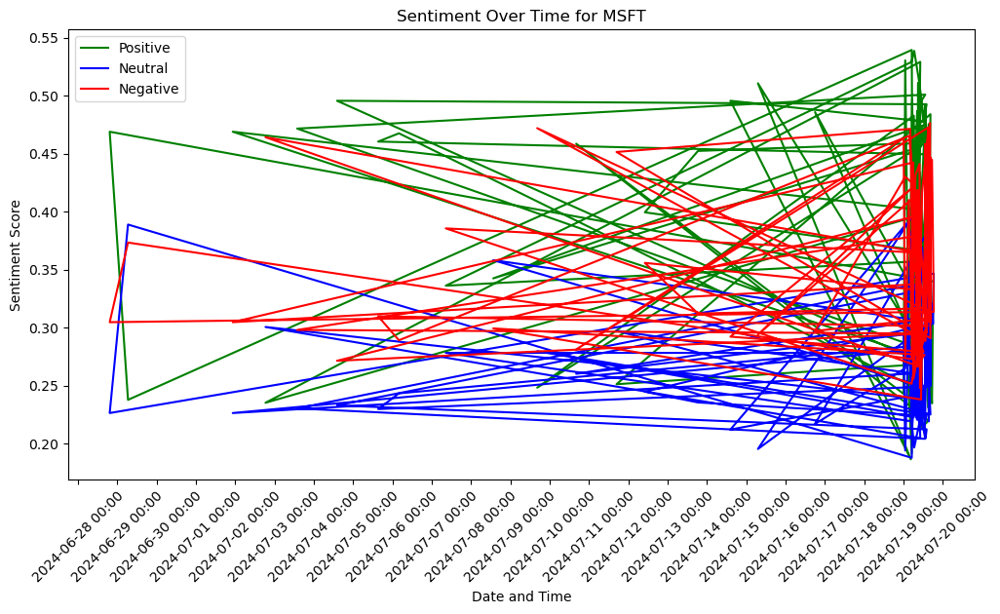

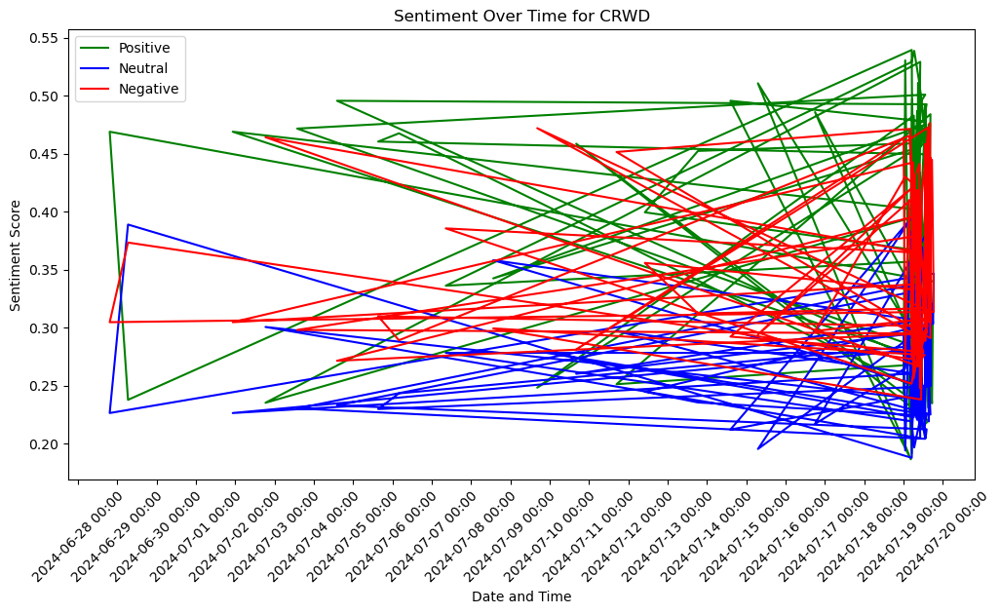

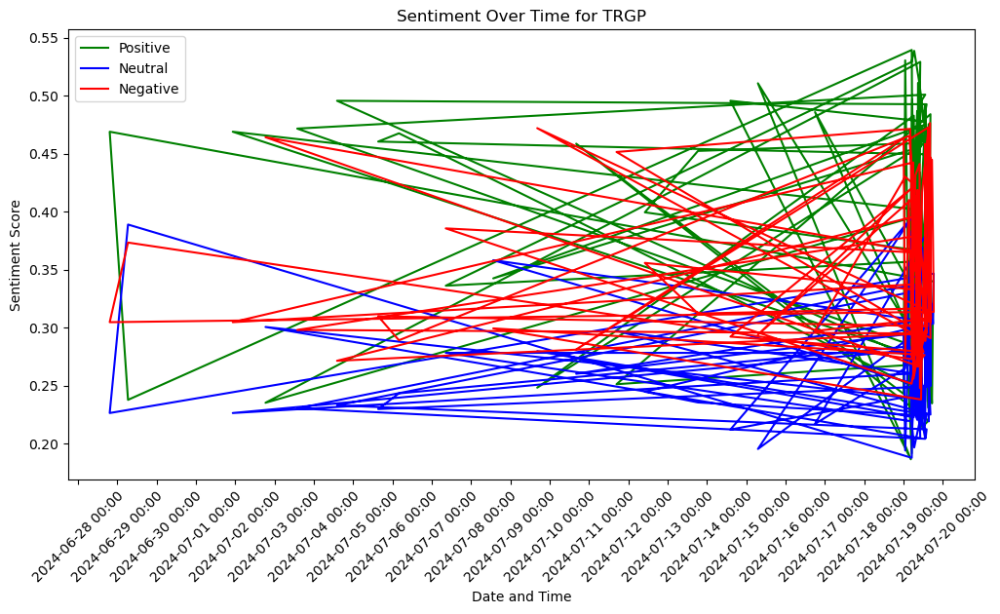

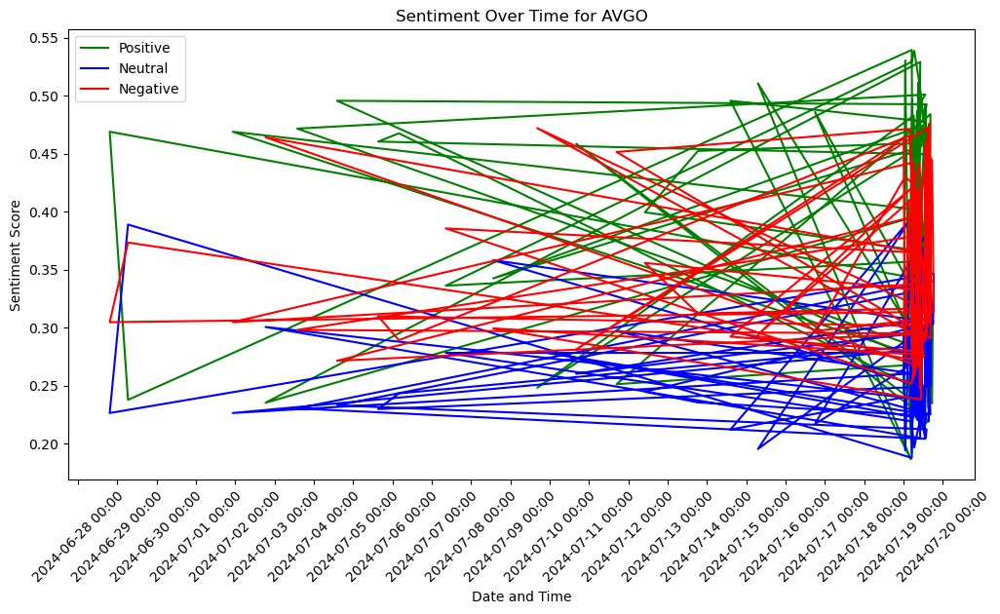

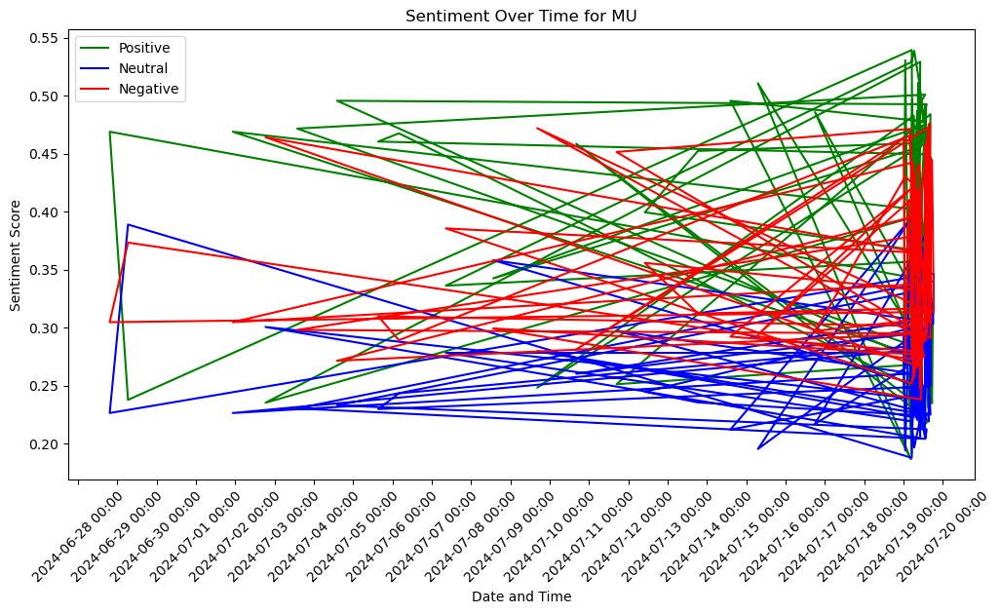

In [52]:
# Convert 'Date and Time' to datetime
df['Date and Time'] = pd.to_datetime(df['Date and Time'], errors='coerce')

# Plot sentiment over time for stocks
stocks=['NKE','AMZN','TCS','BTI','YUMC','NOW','MSFT','CRWD','TRGP','AVGO','MU']

for stock in stocks:

    plt.figure(figsize=(12, 6))
    plt.plot(stock_df['Date and Time'], stock_df['Positive'], label='Positive', color='green')
    plt.plot(stock_df['Date and Time'], stock_df['Neutral'], label='Neutral', color='blue')
    plt.plot(stock_df['Date and Time'], stock_df['Negative'], label='Negative', color='red')
    plt.xlabel('Date and Time')
    plt.ylabel('Sentiment Score')
    plt.title(f'Sentiment Over Time for {stock}')
    plt.legend()
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
    plt.gca().xaxis.set_major_locator(mdates.DayLocator())
    plt.xticks(rotation=45)
    plt.show()
